In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

%matplotlib inline

In [3]:
from kaggle.competitions import twosigmanews
env = twosigmanews.make_env()

Loading the data... This could take a minute.
Done!


In [4]:
(market_train_df, news_train_df) = env.get_training_data()

In [5]:
market_train_df.head()

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
0,2007-02-01 22:00:00+00:00,A.N,Agilent Technologies Inc,2606900.0,32.19,32.17,0.005938,0.005312,NaN,NaN,-0.001860,0.000622,NaN,NaN,0.034672,1.0
1,2007-02-01 22:00:00+00:00,AAI.N,AirTran Holdings Inc,2051600.0,11.12,11.08,0.004517,-0.007168,NaN,NaN,-0.078708,-0.088066,NaN,NaN,0.027803,0.0
2,2007-02-01 22:00:00+00:00,AAP.N,Advance Auto Parts Inc,1164800.0,37.51,37.99,-0.011594,0.025648,NaN,NaN,0.014332,0.045405,NaN,NaN,0.024433,1.0
3,2007-02-01 22:00:00+00:00,AAPL.O,Apple Inc,23747329.0,84.74,86.23,-0.011548,0.016324,NaN,NaN,-0.048613,-0.037182,NaN,NaN,-0.007425,1.0
4,2007-02-01 22:00:00+00:00,ABB.N,ABB Ltd,1208600.0,18.02,18.01,0.011791,0.025043,NaN,NaN,0.012929,0.020397,NaN,NaN,-0.017994,1.0


In [6]:
market_train_df.tail()

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
4072951,2016-12-30 22:00:00+00:00,ZIOP.O,ZIOPHARM Oncology Inc,1608829.0,5.35,5.37,-0.003724,0.000000,0.000536,-0.001868,-0.165367,-0.138042,-0.139597,-0.135913,0.051189,0.0
4072952,2016-12-30 22:00:00+00:00,ZLTQ.O,ZELTIQ Aesthetics Inc,347830.0,43.52,43.62,-0.000689,0.000000,-0.000515,0.000493,0.002996,0.002989,0.008213,0.003210,-0.048555,0.0
4072953,2016-12-30 22:00:00+00:00,ZNGA.O,Zynga Inc,7396601.0,2.57,2.58,-0.011538,0.000000,-0.006004,-0.001034,-0.091873,-0.078571,-0.077252,-0.077188,0.011703,0.0
4072954,2016-12-30 22:00:00+00:00,ZTO.N,Unknown,3146519.0,12.07,12.50,-0.029743,0.007252,-0.028460,0.006719,-0.065066,-0.042146,-0.078104,-0.043813,0.083367,1.0
4072955,2016-12-30 22:00:00+00:00,ZTS.N,Zoetis Inc,1701204.0,53.53,53.64,-0.001678,0.003091,0.005060,0.002885,0.023127,0.028177,0.026566,0.028719,-0.016220,1.0


In [7]:
news_train_df.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
0,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...","{'Z', 'O', 'OIL'}",1438,1,,False,11,275,"{'0857.HK', '0857.F', '0857.DE', 'PTR.N'}",PetroChina Co Ltd,6,0.235702,-1,0.500739,0.419327,0.079934,73,0,0,0,0,0,0,0,3,6,7
1,2007-01-01 07:03:35+00:00,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...","{'PGE', 'PCO', 'G', 'ESN', 'MD', 'PCU', 'DNP',...",4413,1,FEATURE,False,55,907,{'STA.N'},Travelers Companies Inc,8,0.447214,-1,0.600082,0.345853,0.054064,62,1,1,1,1,1,1,1,3,3,3
2,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",2108,2,PRESS DIGEST,False,15,388,"{'WMT.DE', 'WMT.N'}",Wal-Mart Stores Inc,14,0.377964,-1,0.450049,0.295671,0.254280,67,0,0,0,0,0,0,0,5,11,17
3,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,"{'GOOG.O', 'GOOG.OQ', 'GOOGa.DE'}",Google Inc,13,0.149071,-1,0.752917,0.162715,0.084368,83,0,0,0,0,0,0,0,5,13,15
4,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,{'XMSR.O'},XM Satellite Radio Holdings Inc,11,0.149071,-1,0.699274,0.209360,0.091366,102,0,0,0,0,0,0,0,0,0,0


In [8]:
news_train_df.tail()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
9328745,2016-12-30 21:56:06+00:00,2016-12-30 21:56:06+00:00,2016-12-30 21:56:06+00:00,fc80724160cc7bf4,"INTREXON - ON DEC 30, CO, THIRD SECURITY EXECU...",1,1,RTRS,"{'BLR', 'HECA', 'PHMR', 'MRCH', 'US', 'RTRS', ...","{'E', 'U'}",0,1,,False,1,35,{'XON.N'},Intrexon Corp,1,1.0,1,0.115706,0.410445,0.473849,35,0,0,0,0,0,0,1,10,10,10
9328746,2016-12-30 21:56:28+00:00,2016-12-30 21:56:28+00:00,2016-12-30 21:56:06+00:00,2e3e5407e186dd51,INTREXON CORP - AMENDMENT EXTENDS TERM OF SERV...,1,2,RTRS,"{'BLR', 'DBT', 'HECA', 'PHMR', 'MRCH', 'BACT',...","{'E', 'U'}",0,1,,False,1,20,{'XON.N'},Intrexon Corp,1,1.0,1,0.032272,0.122635,0.845093,20,0,0,1,1,1,1,2,11,11,11
9328747,2016-12-30 21:57:00+00:00,2016-12-30 21:57:00+00:00,2016-12-30 21:57:00+00:00,cef1bb88f92ca104,EQUITY ALERT: Rosen Law Firm Announces Investi...,3,1,BSW,"{'CMSS', 'CLJ', 'GEN', 'NEWR', 'HECA', 'PHMR',...","{'BSW', 'CNR'}",3734,1,,False,16,664,"{'SGEN.O', 'SGEN.OQ'}",Seattle Genetics Inc,1,1.0,-1,0.651900,0.227707,0.120393,360,0,0,3,4,4,1,2,18,41,41
9328748,2016-12-30 21:58:53+00:00,2016-12-30 21:58:53+00:00,2016-12-30 21:58:53+00:00,c26c3df1804571a6,PROFESSIONAL DIVERSITY NETWORK INC - FILES FOR...,1,1,RTRS,"{'BLR', 'SWIT', 'ITSE', 'SISU', 'BACT', 'TMT',...","{'E', 'U'}",0,1,,False,1,23,"{'IPDN.O', 'IPDN.OQ'}",Professional Diversity Network Inc,1,1.0,-1,0.816252,0.126928,0.056819,23,0,0,0,0,0,0,0,3,3,3
9328749,2016-12-30 22:00:00+00:00,2016-12-30 22:00:00+00:00,2016-12-30 22:00:00+00:00,daea2d46dc7f5303,"JPMorgan China Region Fund, Inc. Board to Subm...",3,1,BSW,"{'CMSS', 'NEWR', 'INVT', 'BACT', 'BSUP', 'INDS...","{'BSW', 'CNR'}",2969,1,,False,15,492,{'JFC.N'},JPMorgan China Region Fund Inc,1,1.0,1,0.130152,0.388845,0.481002,383,0,0,0,0,0,0,0,0,0,0


# Exploratory Data Analysis

In [9]:
print ('The market_train dataframe has a total of', 
       market_train_df.shape[0], 'data points and', market_train_df.shape[1], 'features.')

The market_train dataframe has a total of 4072956 data points and 16 features.


In [10]:
print ('The news_train dataframe has a total of', 
      news_train_df.shape[0], 'data points and', news_train_df.shape[1], 'features.')

The news_train dataframe has a total of 9328750 data points and 35 features.


In [11]:
#Get a statistical summary for the market_train dataset
market_train_df.describe()

,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
count,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.056976e+06,4.056968e+06,4.072956e+06,4.072956e+06,3.979946e+06,3.979902e+06,4.072956e+06,4.072956e+06
mean,2.665312e+06,3.971241e+01,3.971233e+01,5.473026e-04,9.569113e-03,1.738580e-04,9.309293e-03,5.232021e-03,1.423685e-02,1.638857e-03,1.481702e-02,1.405528e-02,5.949365e-01
std,7.687606e+06,4.228822e+01,4.261116e+01,3.697774e-02,7.084388e+00,3.270305e-02,6.968866e+00,8.872484e-02,7.123552e+00,7.517820e-02,7.285742e+00,7.242467e+00,4.909044e-01
min,0.000000e+00,7.000000e-02,1.000000e-02,-9.776464e-01,-9.998881e-01,-1.235622e+00,-6.158463e+02,-9.774034e-01,-9.998904e-01,-3.343277e+00,-1.375045e+03,-1.375045e+03,0.000000e+00
25%,4.657968e+05,1.725000e+01,1.725000e+01,-1.089241e-02,-1.108987e-02,-8.569246e-03,-1.002114e-02,-3.339148e-02,-3.337574e-02,-2.927584e-02,-2.962645e-02,-2.970509e-02,0.000000e+00
50%,9.821000e+05,3.030000e+01,3.029000e+01,3.373819e-04,3.824092e-04,-1.236127e-04,-3.356938e-06,5.160339e-03,5.165128e-03,8.329261e-04,1.126206e-03,1.044642e-03,1.000000e+00
75%,2.403165e+06,4.986000e+01,4.985000e+01,1.165695e-02,1.183612e-02,8.397528e-03,1.002712e-02,4.297606e-02,4.298507e-02,3.059022e-02,3.171535e-02,3.152750e-02,1.000000e+00
max,1.226791e+09,1.578130e+03,9.998990e+03,4.559245e+01,9.209000e+03,4.512244e+01,8.989207e+03,4.667181e+01,9.382000e+03,4.624971e+01,9.761338e+03,9.761338e+03,1.000000e+00


In [12]:
#Checking null values in the market dataframe
market_train_df.isnull().any()

time                        False
assetCode                   False
assetName                   False
volume                      False
close                       False
open                        False
returnsClosePrevRaw1        False
returnsOpenPrevRaw1         False
returnsClosePrevMktres1      True
returnsOpenPrevMktres1       True
returnsClosePrevRaw10       False
returnsOpenPrevRaw10        False
returnsClosePrevMktres10     True
returnsOpenPrevMktres10      True
returnsOpenNextMktres10     False
universe                    False
dtype: bool

In [13]:
#Get the data type for each column of the market_train df
market_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4072956 entries, 0 to 4072955
Data columns (total 16 columns):
time                        datetime64[ns, UTC]
assetCode                   object
assetName                   category
volume                      float64
close                       float64
open                        float64
returnsClosePrevRaw1        float64
returnsOpenPrevRaw1         float64
returnsClosePrevMktres1     float64
returnsOpenPrevMktres1      float64
returnsClosePrevRaw10       float64
returnsOpenPrevRaw10        float64
returnsClosePrevMktres10    float64
returnsOpenPrevMktres10     float64
returnsOpenNextMktres10     float64
universe                    float64
dtypes: category(1), datetime64[ns, UTC](1), float64(13), object(1)
memory usage: 474.1+ MB


Since we have two different dataset in this study, let's explore them separately before building any models. 

## Market Data

In [14]:
#Get a statistical total volume for each assetCode
assetCode_volume_total = {}
for group in market_train_df.groupby('assetCode'):
    assetCode = group[0]
    total_volume = sum(group[1].volume)
    assetCode_volume_total[assetCode] = total_volume

In [15]:
import numpy as np 
import pandas as pd

#Print out the list of top 10 assetCode with the highest number of volumes
assetCode_volume_total_df = pd.DataFrame.from_dict(assetCode_volume_total, orient='index', columns=['total_volume'])
assetCode_volume_total_df = assetCode_volume_total_df.sort_values(by='total_volume', ascending=False).reset_index()
assetCode_volume_total_df.columns = ['assetCode', 'total_volume']
assetCode_volume_total_df.head(10)

,assetCode,total_volume
0,BAC.N,3.601165e+11
1,GE.N,1.438696e+11
2,F.N,1.336455e+11
3,MSFT.O,1.321638e+11
4,INTC.O,1.233342e+11
5,CSCO.O,1.144949e+11
6,PFE.N,1.011882e+11
7,WFC.N,8.645566e+10
8,JPM.N,7.891265e+10
9,AAPL.O,7.288006e+10


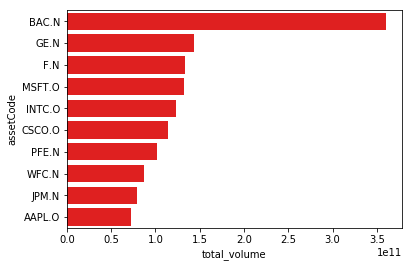

In [16]:
#Visualize the number of total volume by assetCode for the top 10
import seaborn as sns
sns.barplot(y='assetCode', x='total_volume', data=assetCode_volume_total_df[:10], 
           color='red')

In [18]:
main_assetCode = list(assetCode_volume_total_df.assetCode[:10])
main_assetCode

['BAC.N',
 'GE.N',
 'F.N',
 'MSFT.O',
 'INTC.O',
 'CSCO.O',
 'PFE.N',
 'WFC.N',
 'JPM.N',
 'AAPL.O']

In [31]:
market_train_df_top10_volume = market_train_df[market_train_df.assetCode.isin(main_assetCode)]

top10_vol_close_data = []
for label, df in market_train_df_top10_volume.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    close_val = df['close'].values
    top10_vol_close_data.append(go.Scatter(x = time, 
                                     y = close_val, 
                                    name = label))
layout = go.Layout(dict(title = 'Closing Price for the top 10 companies with the highest volume', 
                       xaxis = dict(title = 'Month'), 
                       yaxis = dict(title = 'Price (USD)'), 
                       ), legend=dict(orientation='h'))
py.iplot(dict(data=top10_vol_close_data, layout=layout), filename='basic-line')

It is very interesting that there seems to be a huge gap in the closing price of APPL.O in May of 2014 versus June of 2014. Let's take a look at the open price of these same companies to determine if there is indeed a drop in stock price of APPL.O between these two months. 

In [46]:
top10_vol_open_data = []
for label, df in market_train_df_top10_volume.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    open_val = df['open'].values
    top10_vol_open_data.append(go.Scatter(x = time,
                                          y = open_val, 
                                         name = label))
layout = go.Layout(dict(title = 'Open Price for the top 10 companies with the highest volume', 
                        xaxis = dict(title = 'Month'),
                        yaxis = dict(title = 'Open Price (USD)')), 
                        legend = dict(orientation = 'h'))
py.iplot(dict(data = top10_vol_open_data, layout = layout))
                

After checking on the open price of the APPL.O stock price, we also noticed that the open stock price also has a huge drop between May and June of  2014. Since this is quite strange of a jump, I went online and dug into some of the online news during that period of time. I found that on June 9 of 2014, Apple splitted its stock into something called 7-for-1 split, whichmeans for every share of Apple stock you own, you would get six more even though the stock price dropped from $650 to $92 each. So this kind of gap that we see in my analysis is a legitimate gap and is not an error in the dataset! Since APPL.O's stock price is very high in comparison to the other companies, it probably would be ideal to exclude this assetCode from the list of top 10 companies with highest volume to get a better picture. 



In [60]:
top10_vol_data_without_APPLO = market_train_df_top10_volume[market_train_df_top10_volume['assetCode']!='AAPL.O']

In [84]:
top10_vol_open_without_APPLO = []
top10_vol_close_without_APPLO = []

for label, df in top10_vol_data_without_APPLO.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    open_val = df['open'].values
    close_val = df['close'].values
    top10_vol_open_without_APPLO.append(go.Scatter(x=time, y=open_val, name=label))
    top10_vol_close_without_APPLO.append(go.Scatter(x=time, y=close_val, name=label))

layout1 = go.Layout(dict(title='Open Price of top 10 highest volume companies without APPL.O', 
                        xaxis=dict(title='Month'), 
                        yaxis=dict(title='Close Price (USD)')),
                    legend=dict(orientation='h'))

layout2 = go.Layout(dict(title='Closing Price of top 10 highest volume companies without APPL.O', 
                        xaxis=dict(title='Month'), 
                        yaxis=dict(title='Open Price (USD)')), 
                        legend=dict(orientation='h'))


py.iplot(dict(data=top10_vol_open_without_APPLO, layout=layout1))
py.iplot(dict(data=top10_vol_close_without_APPLO, layout=layout2))

The trends in the two graphs that represent both close and open price for the 9 companies with the higest trading volume seem to be very similar, which makes a complete sense. We can clearly see the collapse of Lehman Brothers during the year of 2008 in the graph, which lingers for a while. This period of time is represented by a deep shallow between the year of 2008-2010. Another significant shallow that we can also see in these graphs is towards the end of the year 2011, which marks the event of Black Monday 2011. in the fiance and investing industry. This event refers to August 8, 2011, when the US and global stock market crashed and it was also the first time in the history the US was downgraded. 


Now, let's shift our focus to the target variable of this study, which is the returnsOpenNextMktres10 variable. However, instead of focusing on the top highest trading volume companies, we will select randomly 20 companies and look at their retunrsOpenNextMktres10 fluctuation. The variable NextMktres10 represents the returns that are calculated from the opening time of one trading to the open of another day during a 10-day horizon interval and also accounted for the movement of the market as a whole (market-residualized) in a forward-looking timeframe. 

In [55]:
random_assetCode = np.random.choice(market_train_df.assetCode.unique(), 20)

In [56]:
random_assetCode_df = market_train_df[market_train_df['assetCode'].isin(random_assetCode)]

In [57]:
random_assetCode_returnsOpenNextMktres10_data = []
for label, df in random_assetCode_df.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format = '%Y-%m-%d').values
    returnsOpenNextMktres10 = df['returnsOpenNextMktres10'].values
    random_assetCode_returnsOpenNextMktres10_data.append(go.Scatter(x=time, 
                                                                   y=returnsOpenNextMktres10, 
                                                                   name=label))
layout = go.Layout(dict(title = 'Market-Residualized Returns Based on Open-to-Open and 10-days Interval'), 
                  xaxis=dict(title='Month'), 
                  yaxis=dict(title='returnsOpenNextMktres10 (USD)'), 
                  legend=dict(orientation='h'))
py.iplot(dict(data=random_assetCode_returnsOpenNextMktres10_data, layout=layout))

According to the graph above, we can see the obvious fluctutation in the returns during the collapse of Lehman Brothers back in 2008, which is the biggest crisis that got identified so far. 